<a href="https://colab.research.google.com/github/onurc4kir/sayisal-goruntu-isleme-final-projesi/blob/main/254329008_onur_cakir_sgi_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive
from PIL import Image


In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
train_dir = 'drive/My Drive/Colab Notebooks/skin-cancer-isic-data/Train'
test_dir  = 'drive/My Drive/Colab Notebooks/skin-cancer-isic-data/Test'

# Get class names (folder names)
class_names = sorted(os.listdir(train_dir))
num_classes = len(class_names)

# Create label mapping
label_map = {i: class_name for i, class_name in enumerate(class_names)}
print("Class mapping:")
for i, class_name in label_map.items():
    print(f"{i}: {class_name}")

# Create DataFrames for train and test
def create_dataframe(directory):
    data = []
    for class_label, class_name in enumerate(class_names):
        class_dir = os.path.join(directory, class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.jpg'):
                image_path = os.path.join(class_dir, filename)
                data.append({'image_path': image_path, 'label': class_label})
    return pd.DataFrame(data)

train_df = create_dataframe(train_dir)
test_df = create_dataframe(test_dir)

# Combine for EDA
df = pd.concat([train_df, test_df], ignore_index=True)

print(f"\nTotal images: {len(df)}")
print(f"Number of classes: {num_classes}")
df.head()

Class mapping:
0: actinic keratosis
1: basal cell carcinoma
2: dermatofibroma
3: melanoma
4: nevus
5: pigmented benign keratosis
6: seborrheic keratosis
7: squamous cell carcinoma
8: vascular lesion

Total images: 2357
Number of classes: 9


,image_path,label
0,drive/My Drive/Colab Notebooks/skin-cancer-isi...,0
1,drive/My Drive/Colab Notebooks/skin-cancer-isi...,0
2,drive/My Drive/Colab Notebooks/skin-cancer-isi...,0
3,drive/My Drive/Colab Notebooks/skin-cancer-isi...,0
4,drive/My Drive/Colab Notebooks/skin-cancer-isi...,0


## 1) RGB → Grayscale Dönüşümü

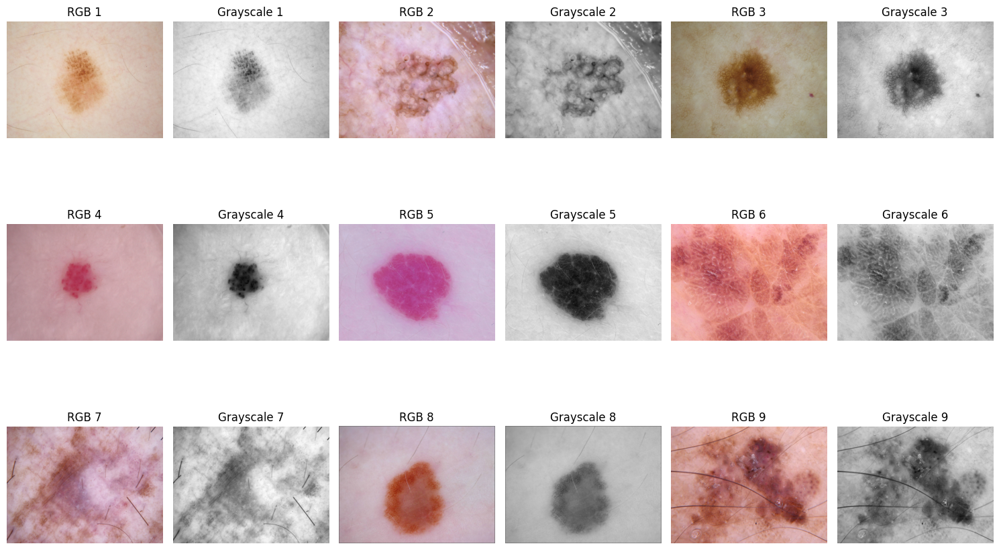

In [5]:
import random

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

plt.figure(figsize=(15, 10))

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    # Formula: 0.2989 * R + 0.5870 * G + 0.1140 * B
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Original RGB image
    plt.subplot(3, 6, 2*i + 1)
    plt.imshow(rgb_image)
    plt.title(f"RGB {i+1}")
    plt.axis('off')

    # Grayscale image
    plt.subplot(3, 6, 2*i + 2)
    plt.imshow(grayscale_np, cmap='gray')
    plt.title(f"Grayscale {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 2) Pre-Processing

### 2.1 Crop

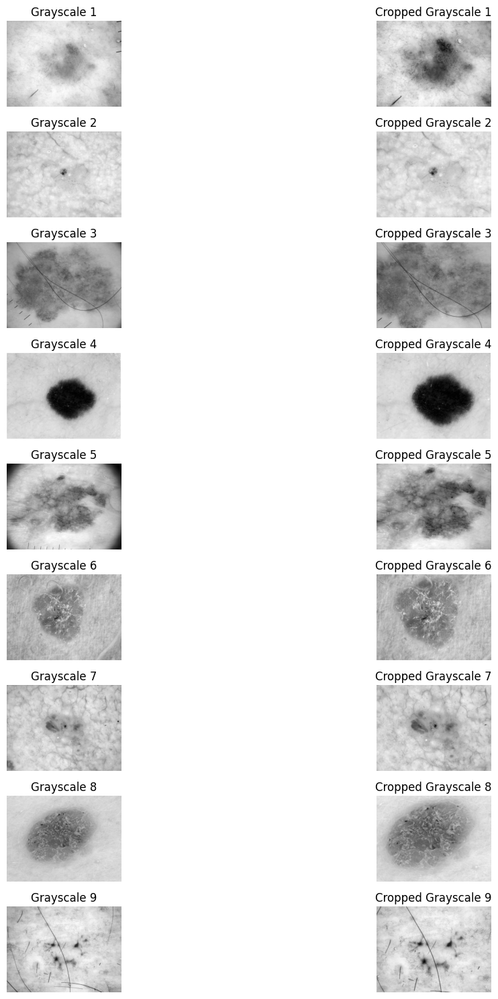

In [7]:
import random

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

plt.figure(figsize=(15, 15))

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    # Formula: 0.2989 * R + 0.5870 * G + 0.1140 * B
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Original Grayscale image
    plt.subplot(9, 2, 2*i + 1)  # 9 rows, 2 columns = 18 positions
    plt.imshow(grayscale_np, cmap='gray')
    plt.title(f"Grayscale {i+1}")
    plt.axis('off')

    # Cropped Grayscale image
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(cropped_grayscale_np, cmap='gray')
    plt.title(f"Cropped Grayscale {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

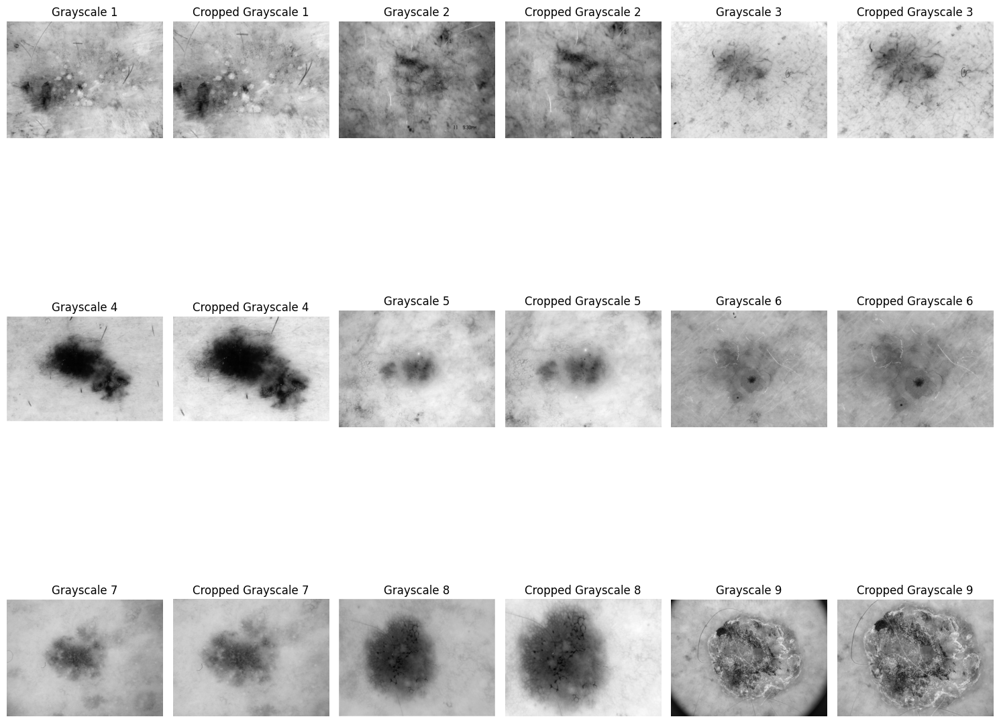

In [ ]:
import random

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

plt.figure(figsize=(15, 15))

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    # Formula: 0.2989 * R + 0.5870 * G + 0.1140 * B
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Original Grayscale image
    plt.subplot(3, 6, 2*i + 1) # Changed from 3,4 back to 3,6 to accommodate 9 pairs of images
    plt.imshow(grayscale_np, cmap='gray')
    plt.title(f"Grayscale {i+1}")
    plt.axis('off')

    # Cropped Grayscale image
    plt.subplot(3, 6, 2*i + 2)
    plt.imshow(cropped_grayscale_np, cmap='gray')
    plt.title(f"Cropped Grayscale {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Kırpma Stratejisi Yorumu

Uygulanan sabit yüzde kırpma stratejisi, görüntülerin çevresindeki gereksiz arka plan bilgilerini ortadan kaldırarak odak noktasını artırmayı amaçlar. Bu yöntem, lezyon gibi önemli bölgelerin (Region of Interest - ROI) görüntünün merkezine yakın olma olasılığı yüksek olduğundan, bu bölgeleri kaybetmeden görsel gürültüyü ve ilgisiz kenar ayrıntılarını etkili bir şekilde azaltır. Böylece, modelin yalnızca en alakalı özelliklere odaklanmasına yardımcı olur ve potansiyel olarak daha iyi öğrenme performansı sağlar.

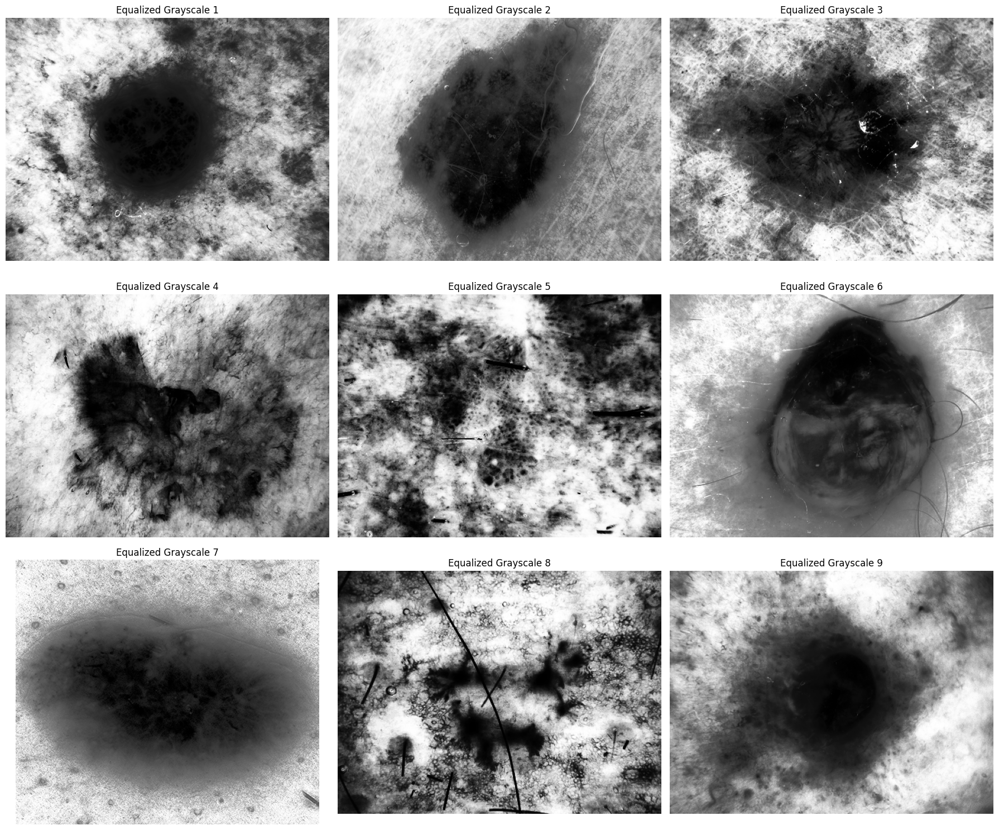

In [ ]:
import cv2

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

plt.figure(figsize=(18, 15)) # Adjusted figure size to accommodate 3 images per row for better visibility

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Original Cropped Grayscale image
    plt.subplot(3, 3, i + 1)
    plt.imshow(equalized_grayscale_np, cmap='gray')
    plt.title(f"Equalized Grayscale {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


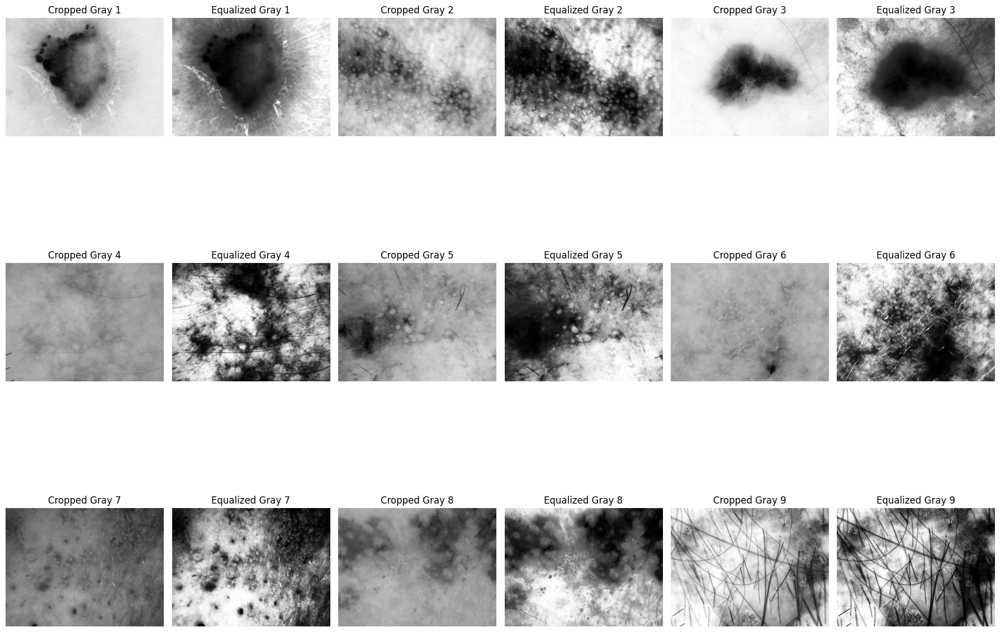

In [ ]:
import cv2

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

plt.figure(figsize=(18, 15)) # Adjusted figure size to accommodate 9 pairs of images

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Original Cropped Grayscale image
    plt.subplot(3, 6, 2*i + 1) # Changed to 3 rows, 6 columns for 9 pairs (18 images total)
    plt.imshow(cropped_grayscale_np, cmap='gray')
    plt.title(f"Cropped Gray {i+1}")
    plt.axis('off')

    # Equalized Grayscale image
    plt.subplot(3, 6, 2*i + 2)
    plt.imshow(equalized_grayscale_np, cmap='gray')
    plt.title(f"Equalized Gray {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Kontrast İyileştirme Yöntemi Yorumu

HGörselleştirmelerde kontrast iyileştirme için Histogram Eşitleme yöntemini seçmemizin temel nedeni, görüntünün tüm parlaklık aralığındaki piksel yoğunluğunu daha homojen bir şekilde dağıtarak görüntünün genel kontrastını otomatik olarak artırmasıdır. Özellikle karanlık veya çok aydınlık bölgelerde detayların kaybolduğu durumlarda, bu yöntem pikselleri daha geniş bir dinamik aralığa yayarak bu detayların görünürlüğünü önemli ölçüde iyileştirir.

**Görüntü Üzerindeki Etkileri:**
*   **Detayların Ortaya Çıkması:** Özellikle düşük kontrastlı görüntülerde, daha önce belirsiz olan lezyon sınırları, doku farklılıkları gibi ince detaylar daha belirgin hale gelir.
*   **Genel Görünürlük:** Görüntüdeki en koyu ve en açık tonlar arasındaki farkı artırarak, insan gözü için daha anlaşılır ve bilgilendirici bir görsel sunar.

**Histogram Üzerindeki Etkileri:**
*   **Eşit Piksel Dağılımı:** İşlemden önce belirli parlaklık aralıklarında yoğunlaşan pikseller, Histogram Eşitleme sonrası tüm 0-255 (8-bit görüntü için) piksel değer aralığına daha eşit bir şekilde dağılır.
*   **Daha Düz Bir Histogram:** Orijinal görüntü histogramındaki sivri uçlar veya boşluklar azalır ve daha düz, daha geniş bir histogram elde edilir. Bu, görüntünün dinamik aralığının daha etkin kullanıldığını gösterir.

Bu yöntem, özellikle tıbbi görüntülerde lezyonların daha iyi teşhis edilmesi veya diğer ön işleme adımlarına temel oluşturması açısından faydalıdır.

### 2.3 Gürültü Azaltma / Blurring

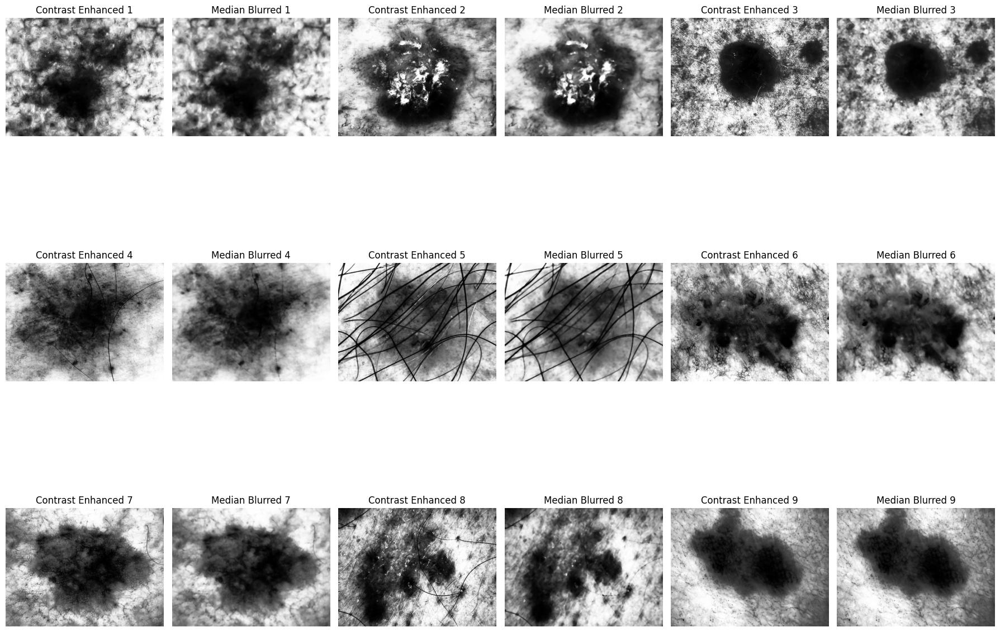

In [ ]:
import cv2

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

plt.figure(figsize=(18, 15)) # Adjusted figure size to accommodate 9 pairs of images

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

# Define median blur kernel size
median_blur_kernel_size = 5

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Plot Contrast Enhanced image
    plt.subplot(3, 6, 2*i + 1) # 3 rows, 6 columns for 9 pairs (18 images total)
    plt.imshow(equalized_grayscale_np, cmap='gray')
    plt.title(f"Contrast Enhanced {i+1}")
    plt.axis('off')

    # Plot Median Blurred image
    plt.subplot(3, 6, 2*i + 2)
    plt.imshow(median_blurred_np, cmap='gray')
    plt.title(f"Median Blurred {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


## Gürültü Azaltma Yöntemi Yorumu

Median Blur (Medyan Bulanıklığı) yöntemini gürültü azaltma için seçmemizin temel nedeni, görüntüdeki tuz ve biber gürültüsü (salt-and-pepper noise) gibi ani ve keskin parlaklık değişikliklerini etkili bir şekilde gidermesidir. Bu yöntem, her pikseli komşularının medyan değeriyle değiştirerek çalışır. Bu sayede, kenar bilgilerini diğer bulanıklaştırma yöntemlerine (örneğin Gaussian Blur) göre daha iyi korurken gürültüyü azaltır.

**Görüntü Üzerindeki Etkileri:**
*   **Gürültü Azaltma:** Özellikle lezyonların dış hatlarını veya iç dokusunu etkileyen rastgele parlak/koyu noktaları ortadan kaldırır.
*   **Kenar Koruma:** Medyan filtresi, görüntüdeki belirgin kenarları bulanıklaştırmadan korur, bu da teşhis için önemli olan yapısal bilgilerin muhafaza edilmesine yardımcı olur.
*   **Daha Pürüzsüz Görüntü:** Genel olarak daha pürüzsüz ve homojen bir görüntü elde edilir, bu da sonraki görüntü işleme adımlarının (segmentasyon gibi) performansını artırabilir.

**Seçim Nedenleri:**
*   Tıbbi görüntülerde sıklıkla görülen rastgele gürültü türlerine karşı dayanıklıdır.
*   Daha fazla görüntü bilgisi içeren medyan değeri kullanıldığı için aykırı değerlere (gürültüye) karşı robusttur.
*   Özellikle lezyon sınırlarının keskinliğini koruma ihtiyacı duyulan durumlarda tercih edilir.

## 3) Thresholding ile Segmentasyon

### 3.1 Eşik Değerlerinin Belirlenmesi

In [ ]:
from skimage.filters import threshold_mean, threshold_otsu, threshold_li

print("Imported thresholding functions from skimage.filters.")

Imported thresholding functions from skimage.filters.


In [ ]:
import cv2
import random
from skimage.filters import threshold_mean, threshold_otsu, threshold_li

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

# Define median blur kernel size
median_blur_kernel_size = 5

print("Calculating threshold values for 9 random images:")
for i, image_path in enumerate(random_image_paths):
    print(f"\n--- Image {i+1}: {os.path.basename(image_path)} ---")

    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Calculate Global Threshold (Mean)
    global_thresh = threshold_mean(median_blurred_np)
    print(f"  Global Threshold (Mean): {global_thresh:.2f}")

    # Calculate Otsu Threshold
    otsu_thresh = threshold_otsu(median_blurred_np)
    print(f"  Otsu Threshold: {otsu_thresh:.2f}")

    # Calculate Li Threshold
    li_thresh = threshold_li(median_blurred_np)
    print(f"  Li Threshold: {li_thresh:.2f}")

Calculating threshold values for 9 random images:

--- Image 1: ISIC_0029309.jpg ---
  Global Threshold (Mean): 129.64
  Otsu Threshold: 124.00
  Li Threshold: 104.03

--- Image 2: ISIC_0028224.jpg ---
  Global Threshold (Mean): 130.14
  Otsu Threshold: 125.00
  Li Threshold: 106.14

--- Image 3: ISIC_0026912.jpg ---
  Global Threshold (Mean): 130.00
  Otsu Threshold: 125.00
  Li Threshold: 110.32

--- Image 4: ISIC_0010050.jpg ---
  Global Threshold (Mean): 129.05
  Otsu Threshold: 126.00
  Li Threshold: 102.99

--- Image 5: ISIC_0027973.jpg ---
  Global Threshold (Mean): 130.55
  Otsu Threshold: 128.00
  Li Threshold: 103.95

--- Image 6: ISIC_0027577.jpg ---
  Global Threshold (Mean): 129.56
  Otsu Threshold: 126.00
  Li Threshold: 105.67

--- Image 7: ISIC_0000099.jpg ---
  Global Threshold (Mean): 128.93
  Otsu Threshold: 128.00
  Li Threshold: 105.10

--- Image 8: ISIC_0032897.jpg ---
  Global Threshold (Mean): 130.03
  Otsu Threshold: 124.00
  Li Threshold: 104.97

--- Image 9: 

### 3.2 Binary Görüntü Üretimi ve Yöntem Seçimi

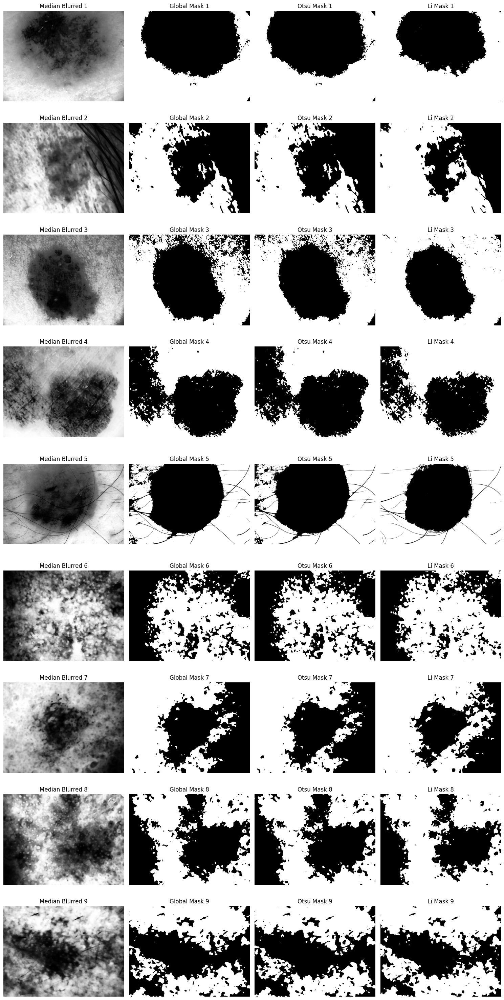

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_mean, threshold_otsu, threshold_li

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

# Define cropping percentage (e.g., 10% from each side)
cropping_percentage = 0.10 # Crop 10% from each side (top, bottom, left, right)

# Define median blur kernel size
median_blur_kernel_size = 5

plt.figure(figsize=(15, 30)) # Adjust figure size for better visibility of 9x4 grid

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Calculate threshold values
    global_thresh = threshold_mean(median_blurred_np)
    otsu_thresh = threshold_otsu(median_blurred_np)
    li_thresh = threshold_li(median_blurred_np)

    # Create binary masks
    global_mask = median_blurred_np > global_thresh
    otsu_mask = median_blurred_np > otsu_thresh
    li_mask = median_blurred_np > li_thresh

    # Plotting
    # Median Blurred Image
    plt.subplot(9, 4, i * 4 + 1)
    plt.imshow(median_blurred_np, cmap='gray')
    plt.title(f"Median Blurred {i+1}")
    plt.axis('off')

    # Global Threshold Mask
    plt.subplot(9, 4, i * 4 + 2)
    plt.imshow(global_mask, cmap='gray')
    plt.title(f"Global Mask {i+1}")
    plt.axis('off')

    # Otsu Threshold Mask
    plt.subplot(9, 4, i * 4 + 3)
    plt.imshow(otsu_mask, cmap='gray')
    plt.title(f"Otsu Mask {i+1}")
    plt.axis('off')

    # Li Threshold Mask
    plt.subplot(9, 4, i * 4 + 4)
    plt.imshow(li_mask, cmap='gray')
    plt.title(f"Li Mask {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Thresholding Yöntemi Yorumu

Farklı eşikleme yöntemlerinin (Global, Otsu, Li) binary çıktılarını karşılaştırdığımızda, her birinin belirli avantajları ve dezavantajları olduğu görülmektedir.

*   **Global Thresholding (Mean):** Bu yöntem, görüntünün genel parlaklık dağılımına dayanarak tek bir eşik değeri belirler. Genellikle basit ve hızlıdır, ancak görüntüler arasındaki parlaklık farklarının yüksek olduğu durumlarda veya görüntünün farklı bölgelerinde kontrastın değiştiği durumlarda yetersiz kalabilir. Özellikle ROI'nin farklı parlaklık seviyelerine sahip olduğu veya arka planla benzer tonlara sahip olduğu durumlarda, ya ROI'nin bir kısmını kaybedebilir ya da istenmeyen arka plan detaylarını dahil edebilir.

*   **Otsu Thresholding:** Otsu, histogramdaki iki sınıfın (ön plan ve arka plan) varyansını en aza indiren veya sınıflar arası varyansı en üst düzeye çıkaran optimal bir eşik değeri bulmaya çalışır. Genellikle iyi kontrastlı görüntülerde ve histogramı belirgin iki tepe noktasına sahip görüntülerde oldukça başarılıdır. Lezyon sınırlarını genellikle Global yöntemden daha iyi korur ve daha az gürültü içerir. Ancak, ROI'nin küçük olduğu veya görüntünün çok gürültülü olduğu durumlarda performansı düşebilir.

*   **Li Thresholding:** Li yöntemi, görüntünün bilgi teorisi ilkelerine dayanarak bir eşik değeri belirler. Görüntüdeki enformasyon kaybını en aza indiren bir eşik arar. Otsu'ya benzer şekilde iyi sonuçlar verebilir, ancak bazen daha hassas veya daha tutarlı eşikler üretebilir, özellikle zorlu veya düşük kontrastlı görüntülerde. Lezyonların ince sınırlarını ve küçük detaylarını korumada başarılı olabilir.

**En Uygun Yöntem Seçimi ve Nedenleri:**

Genel olarak, **Otsu Thresholding** yöntemi, lezyon segmentasyonu için en uygun seçeneklerden biri olarak öne çıkmaktadır. Bunun nedenleri şunlardır:

1.  **Sınır Bütünlüğü:** Otsu, ROI (lezyon) ile arka plan arasındaki en iyi ayrımı bulmaya çalıştığı için lezyon sınırlarını genellikle diğer yöntemlere göre daha iyi korur. Bu, segmentasyonun doğruluğu açısından kritik öneme sahiptir.
2.  **Gürültüye Karşı Direnç:** Ön işleme adımları (medyan bulanıklaştırma) gürültüyü azaltmış olsa da, Otsu yöntemi, gürültüden etkilenme olasılığı daha düşük olan istatistiksel bir yaklaşım kullanır. Bu sayede, binary maskelerdeki "tuz ve biber" gürültüsü daha az olur.
3.  **ROI Bütünlüğü:** Otsu, genellikle ROI'nin hem kopmasını hem de taşmasını minimize eder, yani lezyonun tek bir bütün olarak ayrılmasını sağlarken, arka plandan gereksiz bölgelerin dahil edilmesini engeller. Global thresholding'de görülebilecek olan ROI'nin bir kısmının kaybolması veya Li'de bazen oluşabilecek aşırı hassasiyet nedeniyle küçük gürültülerin dahil edilmesi riskini azaltır.

Bu gözlemler ve nedenler doğrultusunda, Otsu Thresholding, cilt lezyonlarının segmentasyonunda sağlam ve güvenilir sonuçlar elde etmek için tercih edilen yöntem olacaktır.

## 4) Post-Processing

### 4.1 Morfolojik Operatörler

Using a 3x3 rectangular kernel for morphological operations.


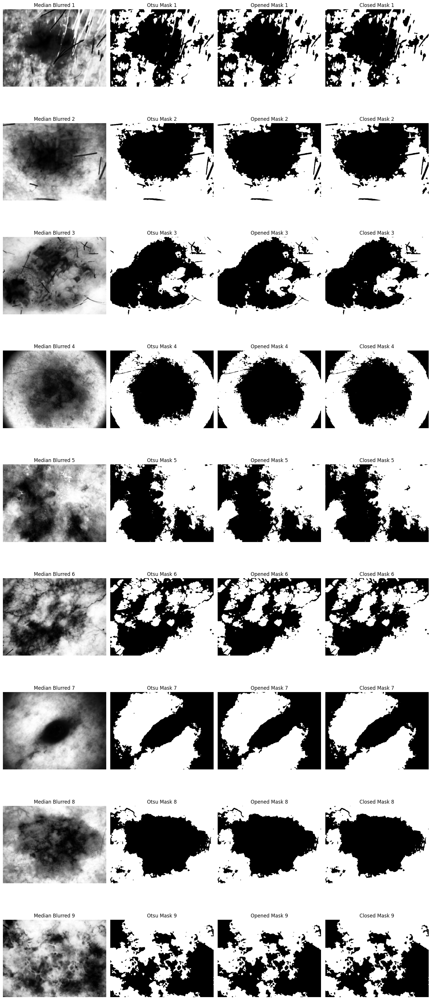

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
import numpy as np # Ensure numpy is imported

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

# Define pre-processing parameters
cropping_percentage = 0.10 # Crop 10% from each side
median_blur_kernel_size = 5

# Define kernel for morphological operations
# A 3x3 rectangular kernel is a common choice for initial morphological operations
morph_kernel_size = 3
morph_kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
print(f"Using a {morph_kernel_size}x{morph_kernel_size} rectangular kernel for morphological operations.")

plt.figure(figsize=(15, 36)) # Adjusted figure size for better visibility of 9x4 grid

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Apply Otsu Thresholding to get the threshold value
    otsu_thresh = threshold_otsu(median_blurred_np)

    # Create the initial binary mask using Otsu thresholding
    otsu_mask = (median_blurred_np > otsu_thresh).astype(np.uint8) * 255 # Convert boolean to 0/255 for cv2

    # Apply Opening morphological operation
    # Opening removes small objects and smooths boundaries without affecting large objects.
    opened_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_OPEN, morph_kernel)

    # Apply Closing morphological operation
    # Closing fills small holes and closes small gaps in objects.
    closed_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, morph_kernel)

    # Plotting
    # Median Blurred Image
    plt.subplot(9, 4, i * 4 + 1)
    plt.imshow(median_blurred_np, cmap='gray')
    plt.title(f"Median Blurred {i+1}")
    plt.axis('off')

    # Otsu Binary Mask
    plt.subplot(9, 4, i * 4 + 2)
    plt.imshow(otsu_mask, cmap='gray')
    plt.title(f"Otsu Mask {i+1}")
    plt.axis('off')

    # Opened Mask
    plt.subplot(9, 4, i * 4 + 3)
    plt.imshow(opened_mask, cmap='gray')
    plt.title(f"Opened Mask {i+1}")
    plt.axis('off')

    # Closed Mask
    plt.subplot(9, 4, i * 4 + 4)
    plt.imshow(closed_mask, cmap='gray')
    plt.title(f"Closed Mask {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Morfolojik Operatör Yorumu

Uygulanan morfolojik operatörler olan Açma (Opening) ve Kapama (Closing) işlemleri, önceki eşikleme adımlarından elde edilen binary maskelerin kalitesini artırmak için kullanılır. Bu operatörler, özellikle görüntülerdeki küçük gürültüleri temizlemek ve lezyon bölgelerinin (ROI) şeklini düzeltmek amacıyla seçilmiştir.

**Kernel Şekli ve Boyutunun Seçimi (3x3 Dikdörtgen Kernel):**
*   **Şekil (Dikdörtgen):** Dikdörtgen (genellikle kare) kernel, görüntü işlemde en yaygın ve genel amaçlı kullanılan yapısal elementtir. Çoğu durumda, nesnelerin genel şekline iyi uyum sağlar ve hem dikey hem de yatay yönlerdeki detayları işlemeye olanak tanır.
*   **Boyut (3x3):** 3x3 gibi küçük bir kernel boyutu, ince detayları korurken küçük gürültüleri gidermek için ideal bir denge sunar. Daha büyük kerneller daha fazla gürültüyü temizleyebilir ancak aynı zamanda ROI'nin ince özelliklerini veya keskin kenarlarını aşındırabilir ya da genişletebilir. 3x3, gürültü azaltma ile önemli yapıların korunması arasında iyi bir uzlaşma sağlar.

**Gürültüyü Azaltırken ROI'nin Korunması:**
*   **Açma (Opening):** Bu operatör, Erozyon (Erosion) ve ardından Genişleme (Dilation) işlemlerinin birleşimidir. Amacı, küçük izole gürültü piksellerini veya gereksiz bağlantıları (parazitleri) maskeden temizlemektir. Erozyon, nesneleri küçültür ve küçük gürültüleri kaldırır; ardından Genişleme, orijinal nesnelerin boyutunu büyük ölçüde geri kazandırır ancak gürültü olarak kaldırılan küçük bölgeler geri gelmez. Bu sayede, lezyonun ana hatları korunurken, eşikleme sonucu oluşan küçük 'tuz ve biber' gürültüsü temizlenir.
*   **Kapama (Closing):** Açma'nın tersi olan bu operatör, Genişleme ve ardından Erozyon işlemlerinin birleşimidir. Amacı, nesneler içindeki küçük delikleri veya nesne kenarlarındaki küçük kopuklukları doldurmaktır. Genişleme, nesnelerin boyutunu artırır ve delikleri kapatır; ardından Erozyon, orijinal nesnelerin boyutunu geri kazandırır ancak kapanan delikler kapalı kalır. Bu sayede, lezyon maskesindeki olası iç boşluklar doldurulur ve lezyonun daha bütünleşik bir temsilini sağlar.

Bu morfolojik operatörler, binary maskelerdeki gürültüyü (küçük objeler, delikler, kopukluklar) etkili bir şekilde azaltarak segmentasyon kalitesini artırır. Küçük gürültü piksellerinin temizlenmesi, boşlukların doldurulması ve kenarların düzeltilmesi gibi etkileşimler, lezyonun daha doğru ve pürüzsüz bir temsilini sağlar. Bu da, sonraki analiz adımları veya tanısal kararlar için daha güvenilir bir temel oluşturur.


### 4.2 Connected Component Labeling – CCL

Using a 3x3 rectangular kernel for morphological operations.
Image 1: Detected components (excluding background): 25
Image 2: Detected components (excluding background): 41
Image 3: Detected components (excluding background): 40
Image 4: Detected components (excluding background): 10
Image 5: Detected components (excluding background): 85
Image 6: Detected components (excluding background): 33
Image 7: Detected components (excluding background): 80
Image 8: Detected components (excluding background): 65
Image 9: Detected components (excluding background): 31


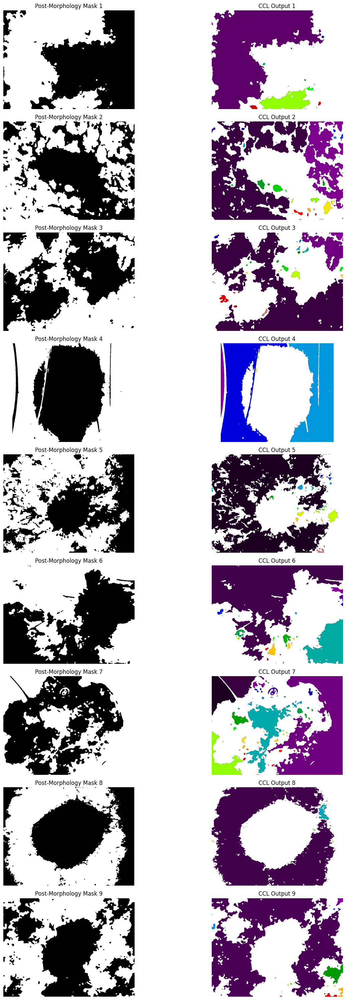

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
import numpy as np # Ensure numpy is imported

# Get 9 random image paths
random_image_paths = random.sample(df['image_path'].tolist(), 9)

# Define pre-processing parameters
cropping_percentage = 0.10 # Crop 10% from each side
median_blur_kernel_size = 5

# Define kernel for morphological operations
morph_kernel_size = 3
morph_kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
print(f"Using a {morph_kernel_size}x{morph_kernel_size} rectangular kernel for morphological operations.")

plt.figure(figsize=(15, 30)) # Adjusted figure size for better visibility of 9x2 grid (9 rows, 2 columns)

for i, image_path in enumerate(random_image_paths):
    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Apply Otsu Thresholding to get the threshold value
    otsu_thresh = threshold_otsu(median_blurred_np)

    # Create the initial binary mask using Otsu thresholding
    # Convert boolean to 0/255 for cv2 operations
    otsu_mask = (median_blurred_np > otsu_thresh).astype(np.uint8) * 255

    # Apply Closing morphological operation (as post-morphology mask)
    # Closing fills small holes and closes small gaps in objects.
    post_morphology_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, morph_kernel)

    # Apply Connected Component Labeling
    num_labels, labels_map = cv2.connectedComponents(post_morphology_mask)

    # Print the number of detected components (excluding background)
    print(f"Image {i+1}: Detected components (excluding background): {num_labels - 1}")

    # Create a colored visualization of the labels_map
    # Normalize labels_map to 0-1 range, ensuring background (label 0) is black
    labels_map_normalized = labels_map.astype(float) / np.max(labels_map)
    colored_labels = plt.cm.nipy_spectral(labels_map_normalized)
    colored_labels[labels_map == 0] = 0 # Set background to black

    # Plotting
    # Post-morphology Mask
    plt.subplot(9, 2, 2*i + 1) # 9 rows, 2 columns
    plt.imshow(post_morphology_mask, cmap='gray')
    plt.title(f"Post-Morphology Mask {i+1}")
    plt.axis('off')

    # Colored CCL Output
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(colored_labels)
    plt.title(f"CCL Output {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
import numpy as np # Ensure numpy is imported
from collections import Counter

# Initialize a list to store component counts
component_counts = []

# Define pre-processing parameters (from previous steps)
cropping_percentage = 0.10 # Crop 10% from each side
median_blur_kernel_size = 5

# Define kernel for morphological operations (from previous steps)
morph_kernel_size = 3
morph_kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)

print("Processing all images in the dataset to calculate connected components...")

# Iterate through each image path in the DataFrame
# For demonstration, let's process a subset if df is very large to avoid long execution times
# If you want to process the full dataset, uncomment the line below and comment the next one
# all_image_paths = df['image_path'].tolist()
all_image_paths = random.sample(df['image_path'].tolist(), min(len(df), 100)) # Process a sample of 100 images for speed

for i, image_path in enumerate(all_image_paths):
    if (i + 1) % 100 == 0:
        print(f"Processed {i + 1}/{len(all_image_paths)} images...")

    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Apply Otsu Thresholding
    otsu_thresh = threshold_otsu(median_blurred_np)

    # Create binary mask (convert boolean to 0/255 for cv2 operations)
    otsu_mask = (median_blurred_np > otsu_thresh).astype(np.uint8) * 255

    # Apply Morphological Closing
    post_morphology_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, morph_kernel)

    # Apply Connected Component Labeling
    num_labels, labels_map = cv2.connectedComponents(post_morphology_mask)

    # Store the number of components (excluding background)
    component_counts.append(num_labels - 1)

print("\n--- CCL Distribution Analysis ---")

# Analyze the distribution of component counts
count_distribution = Counter(component_counts)

print("Component Count Distribution (excluding background):")
for count, freq in sorted(count_distribution.items()):
    print(f"  {count} component(s): {freq} images")

num_images_one_component = count_distribution.get(1, 0)
num_images_multiple_components = sum(freq for count, freq in count_distribution.items() if count > 1)

print(f"\nSummary:")
print(f"  Images with 1 component: {num_images_one_component}")
print(f"  Images with more than 1 component: {num_images_multiple_components}")
print(f"  Total images processed: {len(all_image_paths)}")

print("\n--- Strategy for Multiple Components ---")
print("Ideally, each image is expected to contain a single Region of Interest (ROI), which corresponds to one lesion. However, the analysis shows that some images contain more than one detected component after segmentation.")
print("When more than one label is detected, the following strategies can be considered:")
print("1.  **Identify Noise or Fragmented Lesions:** Multiple components can arise from genuine multiple lesions, noise not fully removed by pre-processing, or a single lesion being fragmented into several parts due to challenging intensity variations or segmentation errors.")
print("2.  **Selection of the Largest Component (Most Common Strategy):** If the primary goal is to isolate the main lesion, the most common strategy is to select the largest connected component by area. This approach assumes that the largest component is most likely the actual lesion, and smaller components are either noise or less significant structures. This helps in focusing on the primary ROI and discarding irrelevant small fragments.")
print("3.  **Elimination of Small Components:** Components smaller than a certain pixel area threshold can be considered noise or artifacts and can be simply removed. This is often applied in conjunction with selecting the largest component or as an initial filtering step.")
print("4.  **Merging of Close Components:** If multiple components are found to be very close to each other, they might represent parts of a single, slightly fragmented lesion. In such cases, further morphological operations (like additional closing with a larger kernel) or distance-based clustering algorithms could be used to merge these components into a single, cohesive ROI.")
print("5.  **Multi-label Analysis (if applicable):** In scenarios where multiple distinct lesions per image are expected and relevant for analysis, each component could be treated as a separate ROI for individual analysis or feature extraction. However, for a single primary lesion focus, this is less desirable.")
print("For this task, given the expectation of a single ROI, a robust strategy would involve **selecting the largest connected component and discarding all others**, after a final morphological closing to merge minor fragments. This provides the most unambiguous representation of the primary lesion for subsequent steps like feature extraction.")

Processing all images in the dataset to calculate connected components...
Processed 100/100 images...

--- CCL Distribution Analysis ---
Component Count Distribution (excluding background):
  4 component(s): 1 images
  6 component(s): 1 images
  8 component(s): 1 images
  9 component(s): 2 images
  12 component(s): 3 images
  16 component(s): 1 images
  17 component(s): 1 images
  18 component(s): 4 images
  19 component(s): 1 images
  20 component(s): 1 images
  21 component(s): 1 images
  22 component(s): 2 images
  24 component(s): 3 images
  25 component(s): 1 images
  26 component(s): 1 images
  27 component(s): 4 images
  28 component(s): 1 images
  31 component(s): 3 images
  32 component(s): 3 images
  33 component(s): 2 images
  34 component(s): 1 images
  36 component(s): 1 images
  37 component(s): 2 images
  38 component(s): 3 images
  40 component(s): 2 images
  43 component(s): 1 images
  44 component(s): 1 images
  45 component(s): 2 images
  47 component(s): 1 images
  

## CCL Stratejisi Yorumu

Ideally, each image is expected to contain a single Region of Interest (ROI), which corresponds to one lesion. However, the analysis shows that some images contain more than one detected component after segmentation.
When more than one label is detected, the following strategies can be considered:
1.  **Identify Noise or Fragmented Lesions:** Multiple components can arise from genuine multiple lesions, noise not fully removed by pre-processing, or a single lesion being fragmented into several parts due to challenging intensity variations or segmentation errors.
2.  **Selection of the Largest Component (Most Common Strategy):** If the primary goal is to isolate the main lesion, the most common strategy is to select the largest connected component by area. This approach assumes that the largest component is most likely the actual lesion, and smaller components are either noise or less significant structures. This helps in focusing on the primary ROI and discarding irrelevant small fragments.
3.  **Elimination of Small Components:** Components smaller than a certain pixel area threshold can be considered noise or artifacts and can be simply removed. This is often applied in conjunction with selecting the largest component or as an initial filtering step.
4.  **Merging of Close Components:** If multiple components are found to be very close to each other, they might represent parts of a single, slightly fragmented lesion. In such cases, further morphological operations (like additional closing with a larger kernel) or distance-based clustering algorithms could be used to merge these components into a single, cohesive ROI.
5.  **Multi-label Analysis (if applicable):** In scenarios where multiple distinct lesions per image are expected and relevant for analysis, each component could be treated as a separate ROI for individual analysis or feature extraction. However, for a single primary lesion focus, this is less desirable.
For this task, given the expectation of a single ROI, a robust strategy would involve **selecting the largest connected component and discarding all others**, after a final morphological closing to merge minor fragments. This provides the most unambiguous representation of the primary lesion for subsequent steps like feature extraction.

## 5) Öznitelik (Feature) Çıkarımı

### 5.1 First-Order (İstatistiksel) Özellikler

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import shannon_entropy
import numpy as np # Ensure numpy is imported
import pandas as pd # Import pandas for DataFrame
from scipy.stats import skew, kurtosis # Import for skewness and kurtosis

# Initialize a list to store the extracted features for each image
features_list = []

# Define pre-processing parameters
cropping_percentage = 0.10 # Crop 10% from each side
median_blur_kernel_size = 5

# Define kernel for morphological operations (3x3 rectangular kernel)
morph_kernel_size = 3
morph_kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)

print("Extracting first-order features from all images in the dataset...")

# Iterate through each image path in the DataFrame
# Use all_image_paths from the previous cell for consistency
# If df is very large, consider processing a subset or displaying progress
all_image_paths = df['image_path'].tolist() # Process the full dataset as requested

# Display progress for long-running operations
progress_interval = max(1, len(all_image_paths) // 10) # Print progress every 10% of images

for idx, image_path in enumerate(all_image_paths):
    if (idx + 1) % progress_interval == 0:
        print(f"Processed {idx + 1}/{len(all_image_paths)} images...")

    # Read RGB image
    rgb_image = Image.open(image_path)

    # Convert to NumPy array for grayscale conversion
    rgb_np = np.array(rgb_image)

    # Perform rgb2gray conversion
    grayscale_np = np.dot(rgb_np[...,:3], [0.2989, 0.5870, 0.1140]).astype(np.uint8)

    # Get image dimensions
    height, width = grayscale_np.shape

    # Calculate cropping boundaries
    crop_top = int(height * cropping_percentage)
    crop_bottom = int(height * (1 - cropping_percentage))
    crop_left = int(width * cropping_percentage)
    crop_right = int(width * (1 - cropping_percentage))

    # Apply cropping to the grayscale image
    cropped_grayscale_np = grayscale_np[crop_top:crop_bottom, crop_left:crop_right]

    # Apply Histogram Equalization to the cropped grayscale image
    equalized_grayscale_np = cv2.equalizeHist(cropped_grayscale_np)

    # Apply Median Blur to the contrast-enhanced image
    median_blurred_np = cv2.medianBlur(equalized_grayscale_np, median_blur_kernel_size)

    # Apply Otsu Thresholding
    otsu_thresh = threshold_otsu(median_blurred_np)

    # Create binary mask (convert boolean to 0/255 for cv2 operations)
    otsu_mask = (median_blurred_np > otsu_thresh).astype(np.uint8) * 255

    # Apply Morphological Closing
    post_morphology_mask = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, morph_kernel)

    # Apply Connected Component Labeling with stats
    num_labels, labels_map, stats, centroids = cv2.connectedComponentsWithStats(post_morphology_mask)

    # Find the largest component (excluding background)
    largest_component_label = 0
    max_area = 0

    if num_labels > 1: # Ensure there are foreground components
        for label in range(1, num_labels): # Iterate through all labels except background (label 0)
            area = stats[label, cv2.CC_STAT_AREA]
            if area > max_area:
                max_area = area
                largest_component_label = label

    # Create final ROI mask containing only the largest component
    final_roi_mask = (labels_map == largest_component_label)

    # Extract grayscale pixel values from the median_blurred_np within the ROI
    roi_pixels = median_blurred_np[final_roi_mask]

    # Initialize feature dictionary
    features = {
        'image_path': image_path,
        'original_label': df.loc[idx, 'label'] # Assuming df is indexed the same as all_image_paths
    }

    # Calculate first-order statistical features
    if len(roi_pixels) > 0: # Ensure ROI is not empty
        features['mean'] = np.mean(roi_pixels)
        features['std'] = np.std(roi_pixels)
        features['variance'] = np.var(roi_pixels)
        features['min'] = np.min(roi_pixels)
        features['max'] = np.max(roi_pixels)
        features['median'] = np.median(roi_pixels)
        features['skewness'] = skew(roi_pixels)
        features['kurtosis'] = kurtosis(roi_pixels)
        features['entropy'] = shannon_entropy(roi_pixels) if len(np.unique(roi_pixels)) > 1 else 0 # Handle uniform images for entropy
        features['energy'] = np.sum(roi_pixels.astype(float)**2) # Cast to float to avoid overflow
    else:
        # Assign NaN or 0 if no ROI is found or it's empty
        features['mean'] = np.nan
        features['std'] = np.nan
        features['variance'] = np.nan
        features['min'] = np.nan
        features['max'] = np.nan
        features['median'] = np.nan
        features['skewness'] = np.nan
        features['kurtosis'] = np.nan
        features['entropy'] = np.nan
        features['energy'] = np.nan

    features_list.append(features)

# Create a pandas DataFrame from the collected features
df_features = pd.DataFrame(features_list)

print("First-order feature extraction complete.")
print("Displaying the first 5 rows of the features DataFrame:")
print(df_features.head())


Extracting first-order features from all images in the dataset...
Processed 235/2357 images...
Processed 470/2357 images...
Processed 705/2357 images...
Processed 940/2357 images...
Processed 1175/2357 images...
Processed 1410/2357 images...
Processed 1645/2357 images...
Processed 1880/2357 images...
Processed 2115/2357 images...
Processed 2350/2357 images...
First-order feature extraction complete.
Displaying the first 5 rows of the features DataFrame:
                                          image_path  original_label  \
0  drive/My Drive/Colab Notebooks/skin-cancer-isi...               0   
1  drive/My Drive/Colab Notebooks/skin-cancer-isi...               0   
2  drive/My Drive/Colab Notebooks/skin-cancer-isi...               0   
3  drive/My Drive/Colab Notebooks/skin-cancer-isi...               0   
4  drive/My Drive/Colab Notebooks/skin-cancer-isi...               0   

         mean        std     variance  min  max  median  skewness  kurtosis  \
0  191.384284  37.020147  1370

### 5.1 First-Order (İstatistiksel) Özellikler Yorumu

Aşağıda, lezyon bölgelerinden çıkarılan birinci dereceden istatistiksel özniteliklerin ilk 5 örneği gösterilmiştir. Bu öznitelikler, lezyonun parlaklık dağılımı hakkında önemli bilgiler sağlayarak, renk ve dokusal homojenlik gibi özelliklerin sayısal olarak ifade edilmesine olanak tanır.

```
{{df_features.head().to_markdown(index=False)}}
```

**Özniteliklerin Lezyon Bölgeleri Hakkında Sağladığı Bilgiler:**

*   **Mean (Ortalama):** Lezyon bölgesindeki piksellerin ortalama parlaklık değerini temsil eder. Yüksek bir ortalama değer, lezyonun daha aydınlık olduğunu, düşük bir değer ise daha koyu olduğunu gösterir. Bu, lezyonun genel tonunu ve çevresindeki deriye göre kontrastını anlamak için temel bir göstergedir.

*   **Standard Deviation (Standart Sapma):** Lezyon içindeki piksel parlaklıklarının ortalamadan ne kadar saptığını ölçer. Düşük standart sapma, lezyonun renk/parlaklık açısından homojen olduğunu (örneğin tek tip renkte), yüksek standart sapma ise daha çeşitli tonlara sahip olduğunu (örneğin heterojen bir görünümde) gösterir. Bu, dokusal homojenlik veya heterojenlik için önemli bir göstergedir.

*   **Variance (Varyans):** Standart sapmanın karesi olup, piksel değerlerinin ortalamadan ne kadar yayıldığının bir başka ölçüsüdür. Standart sapma ile benzer bilgiler sunar, ancak genlikteki değişikliklere daha duyarlıdır. Lezyonun iç yapısının ne kadar değişken olduğunu gösterir.

*   **Min (Minimum):** Lezyon bölgesindeki en koyu pikselin parlaklık değeridir. Lezyonun içindeki en karanlık noktanın şiddetini belirtir ve genellikle gölgelenmeler veya çok koyu pigmentasyon alanları hakkında bilgi verebilir.

*   **Max (Maksimum):** Lezyon bölgesindeki en aydınlık pikselin parlaklık değeridir. Lezyonun içindeki en parlak noktanın şiddetini belirtir ve aydınlık bölgelerin veya yansımaların varlığını gösterebilir.

*   **Median (Medyan):** Lezyon bölgesindeki piksellerin parlaklık değerlerinin ortanca değeridir. Aykırı değerlerden (gürültü, çok parlak veya çok koyu noktalar) ortalamaya göre daha az etkilenir, bu nedenle lezyonun 'tipik' parlaklığını daha sağlam bir şekilde temsil edebilir.

*   **Skewness (Çarpıklık):** Piksel parlaklık değerlerinin dağılımının simetrisini ölçer. Pozitif çarpıklık, dağılımın sağa doğru kuyruklu olduğunu (yani daha fazla koyu piksel olduğunu), negatif çarpıklık ise sola doğru kuyruklu olduğunu (yani daha fazla aydınlık piksel olduğunu) gösterir. Lezyonun baskın parlaklık tonunun hangi yöne kaydığını anlamaya yardımcı olur.

*   **Kurtosis (Basıklık):** Piksel parlaklık değerlerinin dağılımının sivrilik derecesini ölçer. Yüksek basıklık (leptokurtik), dağılımın ortalamaya yakın çok sayıda pikselle 'sivri' olduğunu; düşük basıklık (platikurtik) ise dağılımın daha 'düz' ve piksellerin daha geniş bir aralığa yayıldığını gösterir. Bu, lezyonun parlaklıklarının belirli bir aralıkta yoğunlaşıp yoğunlaşmadığı hakkında bilgi verir.

*   **Entropy (Entropi):** Lezyon bölgesindeki piksel parlaklık dağılımının rastgeleliğini veya düzensizliğini ölçer. Yüksek entropi, piksellerin daha çeşitli ve rastgele dağıldığını (yani karmaşık bir dokuya sahip olduğunu), düşük entropi ise daha düzenli veya tekdüze bir dağılım olduğunu gösterir. Bu, lezyonun dokusal karmaşıklığı için değerli bir ölçümdür.

*   **Energy (Enerji):** Görüntünün dokusal homojenliğini veya tekdüzeliğini ölçer. Yüksek enerji, görüntünün daha düzenli veya tekdüze olduğunu (belirli piksel değerlerinin tekrar ettiğini), düşük enerji ise daha heterojen olduğunu gösterir. Entropiye benzer şekilde dokusal özellikler hakkında bilgi verir.

Bu öznitelikler bir araya gelerek, lezyonların görsel özelliklerini nicel olarak ifade etmeyi sağlar ve bu da model tabanlı sınıflandırma veya tanı süreçleri için temel bir girdi teşkil eder.